In [ ]:
# Part2. Basic data exploration and engineering of additional features

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import pandas as pd
import numpy as np
import geocoder

In [2]:
#Import the data from a csv file
df = pd.read_csv("data.csv", sep='\t')

In [3]:
df

,Date/Time,City,State,Shape,Duration,Summary,Posted
0,12/31/15 23:59,Eugene,OR,Fireball,7 minutes,Viewed 4 slow moving orange-ish orbs on new ye...,1/5/16
1,12/31/15 23:59,Salem,UT,Sphere,6 minutes,I was driving home from work and I saw 3 orang...,1/5/16
2,12/31/15 23:55,Fairbanks,AK,Circle,20 minutes,"Eight small circular craft near surface, seen ...",1/5/16
3,12/31/15 23:45,Port Saint Lucie,FL,Sphere,8 minutes,"Very odd. At about 11:45 pm on New Years Eve,...",1/8/16
4,12/31/15 23:00,Wilkes-Barre/Hazleton (between),PA,Oval,5 minutes,Low oval reddish pinkish lights came flying fr...,1/5/16
5,12/31/15 23:00,Steamboat Springs,CO,Light,1 hour,Six red orange lights over tree line that made...,1/5/16
6,12/31/15 23:00,Saint George,UT,Other,10 minutes,We were driving home on the freeway and saw 3 ...,1/20/16
7,12/31/15 22:55,Sacramento,CA,Diamond,5 minutes,Diamond shaped object dropping flares.,1/5/16
8,12/31/15 22:00,Las Vegas,NV,Light,5 minutes,Very bright red light hovering over western re...,1/5/16
9,12/31/15 22:00,Titusville,FL,Light,5 minutes,Saw 2 orange orbs rise from wooded land west o...,1/20/16


In [111]:
#transform date and time columns to a clean format
clean_month = [int(r.split('/')[0]) for r in df['Date/Time']]
clean_day = [int(r.split('/')[1]) for r in df['Date/Time']]
clean_date = [(r.split(' ')[0]) for r in df['Date/Time']]
clean_time = [(r.split(' ')[-1]) for r in df['Date/Time']]

df['Month'] = clean_month
df['Day'] = clean_day
df['Date'] = clean_date
df['Time'] = clean_time

In [112]:

def time_period(time):
    '''
    This is the method to convert time into periods 1,2,...,12. If the time is hh: mm 
    and 2i<hh<2(i+1), then hh:mm belongs to period t.
    Suppose the time is 6:30am, since 2*3<6<2*4, then it belongs to period 3. 
    Args:
        time (time): Time period.
    Returns:
        periods (time): Formatted time period.
        
    '''
    periods=[]
    for t in time:
        try:
            p = int(t.split(':')[0])
            for i in range(12):
                if(p>=2*i) & (p<2*(i+1)):
                    periods.append(i+1)
        except ValueError:
                periods.append(-1)
    return periods  

df['TimePer']=time_period(df['Time'])
df.head(2)

,Date/Time,City,State,Shape,Duration,Summary,Posted,Month,Day,Date,Time,TimePer
0,12/31/15 23:59,Eugene,OR,Fireball,7 minutes,Viewed 4 slow moving orange-ish orbs on new ye...,1/5/16,12,31,12/31/15,23:59,12
1,12/31/15 23:59,Salem,UT,Sphere,6 minutes,I was driving home from work and I saw 3 orang...,1/5/16,12,31,12/31/15,23:59,12


In [113]:
import re
df=df[~df.Duration.isnull()]


def duration_sec(text):
    '''
    Add a duration column with normalized units of measurement (seconds). Extracts the duration in seconds
    by infering the duration from the text.
    Args:
        text (str): String of text.
    Returns:
        (int): Time duration in seconds.
        
    '''
    metric_text = ["second","s","Second","minute","m","min","Minute","hour","h","Hour"]
    metric_seconds = [1,1,1,60,60,60,60,3600,3600,3600]
    for m,st in zip(metric_text, metric_seconds):
        regex = "\s*(\d+)\+?\s*{}s?".format(m)
        a = re.findall(regex,text)
        if len(a)>0:
            return int(int(a[0]) * st)
    return None

In [114]:
# Adding the column of duration with unit of second.
# impute missing duration with mean.

df["Duration_Sec"] = df["Duration"].apply(duration_sec)
df["Duration_Sec"]=df.Duration_Sec.fillna(int(df.Duration_Sec.mean()))
df.head(2)

/Users/annakudryashova/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/annakudryashova/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,Date/Time,City,State,Shape,Duration,Summary,Posted,Month,Day,Date,Time,TimePer,Duration_Sec
0,12/31/15 23:59,Eugene,OR,Fireball,7 minutes,Viewed 4 slow moving orange-ish orbs on new ye...,1/5/16,12,31,12/31/15,23:59,12,420
1,12/31/15 23:59,Salem,UT,Sphere,6 minutes,I was driving home from work and I saw 3 orang...,1/5/16,12,31,12/31/15,23:59,12,360


In [115]:
#create a column with US State 1/0 and filter the dataframe to have only US states
def US_State(x,list):
    if x in list:
        return 1
    else:
        return 0
    

US = ["AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DC", "DE", "FL", "GA", 
          "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD", 
          "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ", "NM", "NY", 
            "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA",
            "WV", "WI", "WY"]
df['US_STATE'] = df['State'].apply(lambda x: US_State(x,US))
df = df[df.US_STATE==1]    


/Users/annakudryashova/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [116]:
# Transfrom the City column to exclude all irrelevant text entries (e.g., additional comments).
clean_city=[]
for r in df['City']:
    try:
        r = r.split('/')[0]
        r = r.split('(')[0]
        r = r.split(',')[0]
        r = r.split('?')[0]
        clean_city.append(r)
    except AttributeError:
        r=None
        clean_city.append('Unknown')
df['City']=clean_city   
df.shape


(14022, 14)

In [117]:
#create placeholder columns for Latitude and Longitude
df['Lat']=np.nan
df['Long']=np.nan
df.head(2)

,Date/Time,City,State,Shape,Duration,Summary,Posted,Month,Day,Date,Time,TimePer,Duration_Sec,US_STATE,Lat,Long
0,12/31/15 23:59,Eugene,OR,Fireball,7 minutes,Viewed 4 slow moving orange-ish orbs on new ye...,1/5/16,12,31,12/31/15,23:59,12,420,1,NaN,NaN
1,12/31/15 23:59,Salem,UT,Sphere,6 minutes,I was driving home from work and I saw 3 orang...,1/5/16,12,31,12/31/15,23:59,12,360,1,NaN,NaN


In [91]:
#Don't run this code - use exported csv data_coord.csv
#extract coordinates for each state-city combination. Write each line to csv.

from geopy.geocoders import ArcGIS
from geopy.exc import GeocoderTimedOut


Latitude=[]
Longitude=[]
geolocator = ArcGIS()
fails=[]
for i in range(len(df)):
    try:
        location = geolocator.geocode(df.iloc[i,1]+','+df.iloc[i,2])
        df.iloc[i,-2] = location.latitude
        df.iloc[i,-1] = location.longitude
        print (i, location.address, df.iloc[i,-2], df.iloc[i,-1])
        df.to_csv('data_coord_1.csv',sep='\t', encoding='utf-8', index=False)
    except (AttributeError, GeocoderTimedOut) as e:
        df.to_csv('data_coord_1.csv',sep='\t', encoding='utf-8', index=False)
        print ('exception:', i)
        
    

0 Eugene, Oregon, United States 44.052068715 -123.086746106
1 Salem, Utah, United States 40.053008083 -111.67353589
2 Fairbanks, Alaska, United States 64.837776235 -147.716386024
3 Port Saint Lucie, Florida, United States 27.293926797 -80.350325945
4 Wilkes-Barre, Pennsylvania, United States 41.245906228 -75.881309016
5 Steamboat Springs, Colorado, United States 40.484978751 -106.831718042
6 Saint George, Utah, United States 37.104149758 -113.584115849
7 Sacramento, California, United States 38.581566656 -121.494395907
8 Las Vegas, Nevada, United States 36.174968712 -115.13721603
9 Titusville, Florida, United States 28.612219814 -80.807548372
10 Scottsdale, Arizona, United States 33.509207266 -111.89902888
11 Menifee, California, United States 33.72834682 -117.146418238
12 Bellingham, Washington, United States 48.759546483 -122.488218218
13 Bay City, Texas, United States 28.982757433 -95.969398441
14 Ypsilanti, Michigan, United States 42.241145912 -83.612986423
15 Gadsden, Alabama, Uni

KeyboardInterrupt: 

In [118]:
#Adding all features to the dataframe 
feature = ['Date','Month','Day','Time','TimePer','City','State', 'Lat','Long','Shape', 'Duration', 
           'Duration_Sec','Summary','Posted','US_STATE']
df = pd.DataFrame(df,columns=feature)
df.head()

,Date,Month,Day,Time,TimePer,City,State,Lat,Long,Shape,Duration,Duration_Sec,Summary,Posted,US_STATE
0,12/31/15,12,31,23:59,12,Eugene,OR,NaN,NaN,Fireball,7 minutes,420,Viewed 4 slow moving orange-ish orbs on new ye...,1/5/16,1
1,12/31/15,12,31,23:59,12,Salem,UT,NaN,NaN,Sphere,6 minutes,360,I was driving home from work and I saw 3 orang...,1/5/16,1
2,12/31/15,12,31,23:55,12,Fairbanks,AK,NaN,NaN,Circle,20 minutes,1200,"Eight small circular craft near surface, seen ...",1/5/16,1
3,12/31/15,12,31,23:45,12,Port Saint Lucie,FL,NaN,NaN,Sphere,8 minutes,480,"Very odd. At about 11:45 pm on New Years Eve,...",1/8/16,1
4,12/31/15,12,31,23:00,12,Wilkes-Barre,PA,NaN,NaN,Oval,5 minutes,300,Low oval reddish pinkish lights came flying fr...,1/5/16,1


In [119]:
df = pd.read_csv("data_coord.csv", sep='\t')
df=df[(~df.Long.isnull()) & (~df.Lat.isnull())]

In [121]:
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
df = df.reset_index()
df['WeekDay'] = df['Date'].dt.dayofweek
df['Week'] = df['Date'].dt.weekofyear
df['Quarter'] = df['Date'].dt.quarter
df['Year'] = df['Date'].dt.year

In [122]:
df.columns

Index(['Date', 'Date/Time', 'City', 'State', 'Shape', 'Duration', 'Summary',
       'Posted', 'Month', 'Day', 'Time', 'Periods', 'Duration_Sec', 'US_STATE',
       'Lat', 'Long', 'WeekDay', 'Week', 'Quarter', 'Year'],
      dtype='object')

In [123]:
stats = pd.read_excel("stats2.xlsx")
stats.head(2)

,state,state abbr,Number of Active Duty members 2014,2014 Popualtion,2015 Population,Share of pop 2014,Share of pop 2015,Region
0,Alabama,AL,7875,4846411,4858979,0.001625,0.001621,South
1,Alaska,AK,19608,737046,738432,0.026603,0.026554,West


In [124]:
stats['State']=stats['state abbr']
df=pd.merge(df, stats, on='State')
df.columns

Index(['Date', 'Date/Time', 'City', 'State', 'Shape', 'Duration', 'Summary',
       'Posted', 'Month', 'Day', 'Time', 'Periods', 'Duration_Sec', 'US_STATE',
       'Lat', 'Long', 'WeekDay', 'Week', 'Quarter', 'Year', 'state',
       'state abbr', 'Number of Active Duty members 2014', '2014 Popualtion',
       '2015 Population', 'Share of pop 2014', 'Share of pop 2015', 'Region'],
      dtype='object')

In [126]:
df.loc[df['Year'] == 2014, 'Pop'] = df['2014 Popualtion'][df['Year'] == 2014]
df.loc[df['Year'] == 2015, 'Pop'] = df['2015 Population'][df['Year'] == 2015]


df.loc[df['Year'] == 2014, 'Milit_Share'] = df['Number of Active Duty members 2014'][df['Year'] == 2014]/df['2014 Popualtion'][df['Year'] == 2014]
df.loc[df['Year'] == 2015, 'Milit_Share'] = df['Number of Active Duty members 2014'][df['Year'] == 2015]/df['2015 Population'][df['Year'] == 2015]

In [127]:
#Adding a Hoax column derived from the Summary column
mylist = ["HOAX","NUFORC Note"]
pattern = '|'.join(mylist)
df['Hoax']=df.Summary.str.contains(pattern)

def binary_convert(value):
    if value==True:
        return  1
    else:
        return 0
    
df['Hoax'] =df['Hoax'].apply(lambda x: binary_convert(x))

In [128]:
df_hoax =df[['Summary','Hoax']]
df_hoax[df_hoax.Hoax==1].shape

(862, 2)

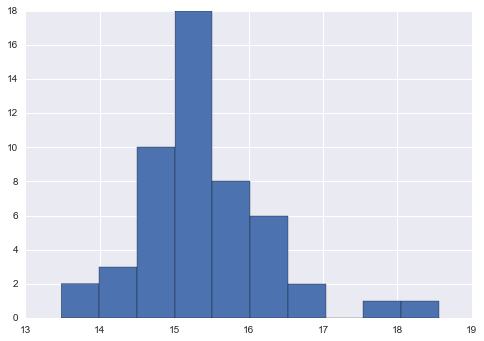

In [58]:
df.groupby('State').Day.mean().hist()

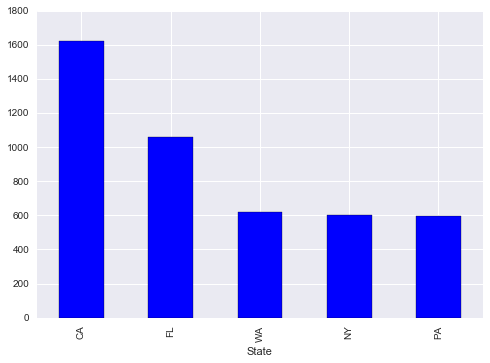

In [59]:
df.groupby(['State'])['Time'].count().nlargest(5).plot('bar')

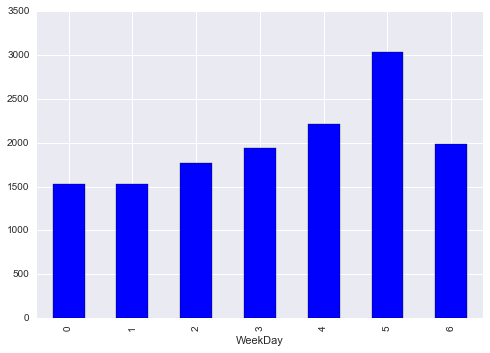

In [60]:
df.groupby(['WeekDay'])['Day'].count().plot('bar')

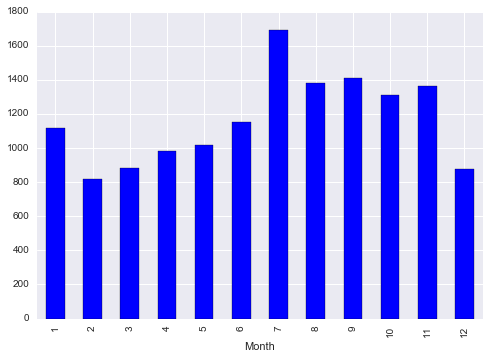

In [61]:
df.groupby(['Month'])['Day'].count().plot('bar')

TimePer
-1       72
 1     1125
 2      570
 3      564
 4      392
 5      293
 6      333
 7      288
 8      302
 9      590
 10    1900
 11    4128
 12    3453
Name: Day, dtype: int64


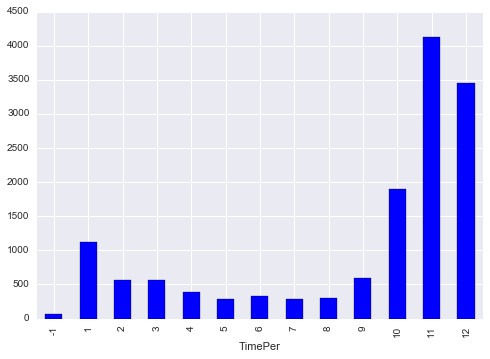

In [62]:
print (df.groupby(['TimePer'])['Day'].count())
df.groupby(['TimePer'])['Day'].count().plot('bar')

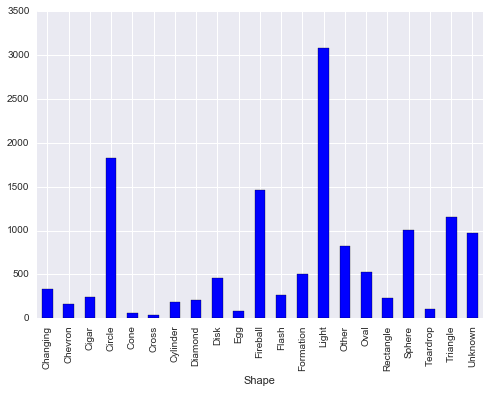

In [63]:
# plot the distribution of shapes
df.groupby(['Shape']) ['Day'].count().plot('bar')

In [64]:
#checking the missing values

df=df[~df.State.isnull() & ~df.City.isnull()]
df.isnull().sum()

Date                0
Month               0
Day                 0
Time                0
TimePer             0
City                0
State               0
Lat             14010
Long            14010
Shape             230
Duration            0
Duration_Sec        0
Summary            64
Posted              0
US_STATE            0
WeekDay             0
Week                0
Quarter             0
dtype: int64

In [129]:
import folium

# Get a basic world map.
UFOmap = folium.Map(location=[30, 0], zoom_start=2)
# Draw markers on the map.
for name, row in df.iterrows():
    UFOmap.circle_marker(location=[row["Lat"], row["Long"]], popup=row["City"])
# Create and show the map.
UFOmap.create_map('UFOmap.html')
UFOmap

/Users/annakudryashova/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:7: FutureWarning: circle_marker is deprecated. Use add_children(CircleMarker) instead
/Users/annakudryashova/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:9: FutureWarning: Map.create_map is deprecated. Use Map.save instead
